Installing the surprise library

In [2]:
!pip install scikit-surprise
!pip install tensorflow

     -------------------------------------- 266.3/266.3 MB 1.3 MB/s eta 0:00:00
     -------------------------------------- 895.9/895.9 kB 1.4 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 1.7 MB/s eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 1.9 MB/s eta 0:00:00
     -------------------------------------- 126.5/126.5 kB 1.9 MB/s eta 0:00:00
     -------------------------------------- 439.2/439.2 kB 2.0 MB/s eta 0:00:00
     ---------------------------------------- 3.7/3.7 MB 2.0 MB/s eta 0:00:00
     -------------------------------------- 23.2/23.2 MB 867.0 kB/s eta 0:00:00
     ---------------------------------------- 65.5/65.5 kB 1.2 MB/s eta 0:00:00
     -------------------------------------- 57.5/57.5 kB 605.5 kB/s eta 0:00:00
     ---------------------------------------- 6.0/6.0 MB 1.1 MB/s eta 0:00:00
     -------------------------------------- 177.2/177.2 kB 1.3 MB/s eta 0:00:00
     -------------------------------------- 781.

import it + necessary modules


In [6]:
import surprise
from surprise import Dataset
from surprise import Reader
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from surprise import Reader, Dataset
from surprise.model_selection import train_test_split
from surprise import accuracy
from surprise.prediction_algorithms import knns, matrix_factorization
from surprise import NMF, CoClustering

In [7]:
student_info = pd.read_csv('studentInfo.csv')
student_assessment = pd.read_csv('studentAssessment.csv')
student_vle = pd.read_csv('studentVle.csv')
vle = pd.read_csv('vle.csv')

divide the variables


In [8]:
student_info = student_info[['code_module', 'code_presentation', 'id_student', 'gender', 'region', 'highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts', 'disability']]
student_assessment = student_assessment[['id_student', 'id_assessment', 'date_submitted', 'is_banked', 'score']]
student_vle = student_vle[['code_module', 'code_presentation', 'id_student', 'id_site', 'sum_click']]

merge the data


In [9]:
merged_df = pd.merge(student_info, student_assessment, on='id_student', how='inner')
merged_df = pd.merge(merged_df, student_vle, on=['id_student', 'code_module', 'code_presentation'], how='inner')

In [10]:
merged_df.tail(2000)

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,disability,id_assessment,date_submitted,is_banked,score,id_site,sum_click
101767008,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,Y,37438,95,0,60.0,896943,2
101767009,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,Y,37438,95,0,60.0,896945,1
101767010,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,Y,37438,95,0,60.0,896981,1
101767011,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,Y,37438,95,0,60.0,897151,1
101767012,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,Y,37438,95,0,60.0,896981,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101769003,GGG,2014J,2684003,F,Yorkshire Region,HE Qualification,50-60%,35-55,0,N,37441,206,0,100.0,896961,13
101769004,GGG,2014J,2684003,F,Yorkshire Region,HE Qualification,50-60%,35-55,0,N,37441,206,0,100.0,896959,2
101769005,GGG,2014J,2684003,F,Yorkshire Region,HE Qualification,50-60%,35-55,0,N,37441,206,0,100.0,896943,1
101769006,GGG,2014J,2684003,F,Yorkshire Region,HE Qualification,50-60%,35-55,0,N,37441,206,0,100.0,896961,31


In [11]:
merged_df.shape

(101769008, 16)

aggregate the data based on sum click for each id_site (summing might make sense)

In [12]:
grouped_df = merged_df.groupby(['id_student', 'code_module', 'code_presentation', 'id_site']).agg({
    'gender': 'first',
    'region': 'first',
    'highest_education': 'first',
    'imd_band': 'first',
    'age_band': 'first',
    'num_of_prev_attempts' : 'first',
    'disability': 'first',
    'id_assessment': 'first',
    'date_submitted': 'first',
    'is_banked': 'first',
    'score': 'first',
    'sum_click': 'sum'
}).reset_index()

In [13]:
grouped_df.head(2000)

,id_student,code_module,code_presentation,id_site,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,disability,id_assessment,date_submitted,is_banked,score,sum_click
0,6516,AAA,2014J,877011,M,Scotland,HE Qualification,80-90%,55<=,0,N,1758,17,0,60.0,115
1,6516,AAA,2014J,877012,M,Scotland,HE Qualification,80-90%,55<=,0,N,1758,17,0,60.0,1525
2,6516,AAA,2014J,877015,M,Scotland,HE Qualification,80-90%,55<=,0,N,1758,17,0,60.0,130
3,6516,AAA,2014J,877023,M,Scotland,HE Qualification,80-90%,55<=,0,N,1758,17,0,60.0,30
4,6516,AAA,2014J,877025,M,Scotland,HE Qualification,80-90%,55<=,0,N,1758,17,0,60.0,455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,28046,DDD,2013J,674047,F,Yorkshire Region,HE Qualification,10-20,35-55,0,N,25348,25,0,58.0,21
1996,28046,DDD,2013J,674049,F,Yorkshire Region,HE Qualification,10-20,35-55,0,N,25348,25,0,58.0,14
1997,28046,DDD,2013J,674053,F,Yorkshire Region,HE Qualification,10-20,35-55,0,N,25348,25,0,58.0,14
1998,28046,DDD,2013J,674054,F,Yorkshire Region,HE Qualification,10-20,35-55,0,N,25348,25,0,58.0,77


In [14]:
grouped_df.shape


(1920298, 16)

In depth data analysis before building the model

Descriptive statistics

In [15]:
#size of the data
print("Number of rows: ", grouped_df.shape[0])
print("Number of columns: ", grouped_df.shape[1])

Number of rows:  1920298
Number of columns:  16


In [16]:
#checking missing values
print(grouped_df.isnull().sum())

id_student                   0
code_module                  0
code_presentation            0
id_site                      0
gender                       0
region                       0
highest_education            0
imd_band                106942
age_band                     0
num_of_prev_attempts         0
disability                   0
id_assessment                0
date_submitted               0
is_banked                    0
score                      352
sum_click                    0
dtype: int64


imd_band 106942 missing values / score 352 missing values, we may drop imd_band and try to use the median or mean for score, we'll see what we'll do

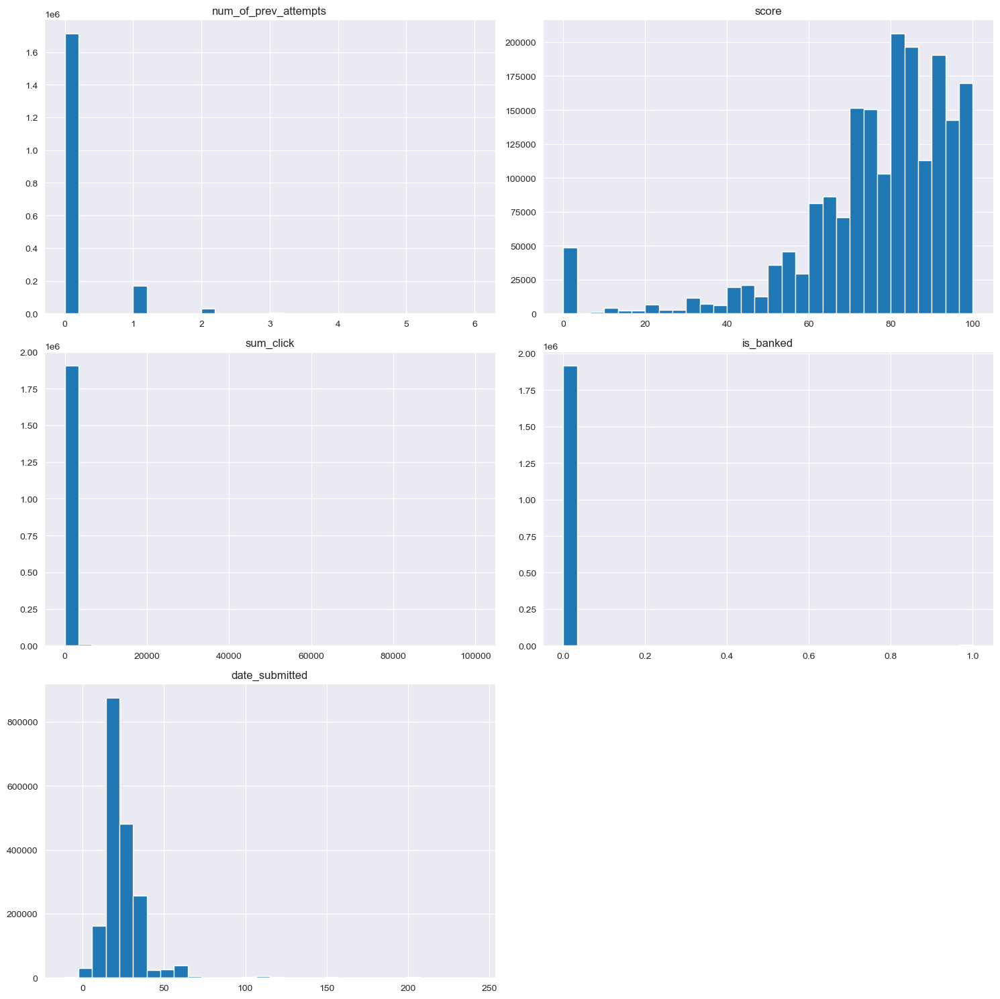

In [17]:
#checking the distribution of each column using histograms
included_cols = ['num_of_prev_attempts','score','sum_click','is_banked','date_submitted']
grouped_df[included_cols].hist(figsize=(15, 15), bins=30)
plt.tight_layout()
plt.show()

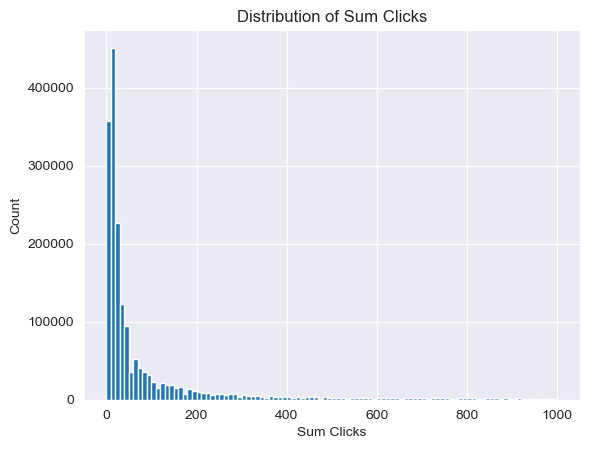

In [18]:
#redisplay the sum_clicks data because it's unclear
plt.hist(grouped_df["sum_click"], bins=100, range=(0, 1000))
plt.title("Distribution of Sum Clicks")
plt.xlabel("Sum Clicks")
plt.ylabel("Count")
plt.show()

check chbehom 50000 jeybin 0 score, why ?

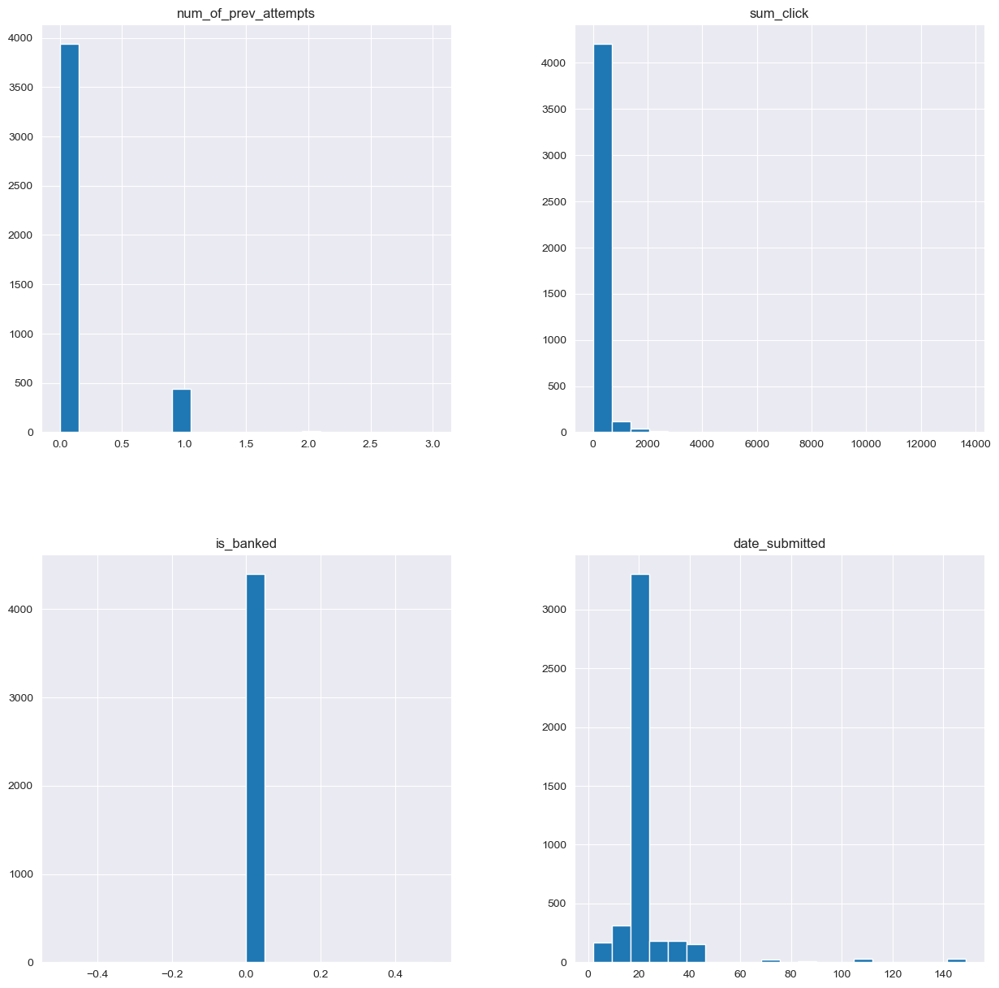

In [19]:
score_zero_df = grouped_df[grouped_df['score'] == 0]
included_cols = ['highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts', 'sum_click', 'is_banked', 'date_submitted', 'gender', 'region', 'disability']

score_zero_df[included_cols].hist(figsize=(15, 15), bins=20)
plt.show()

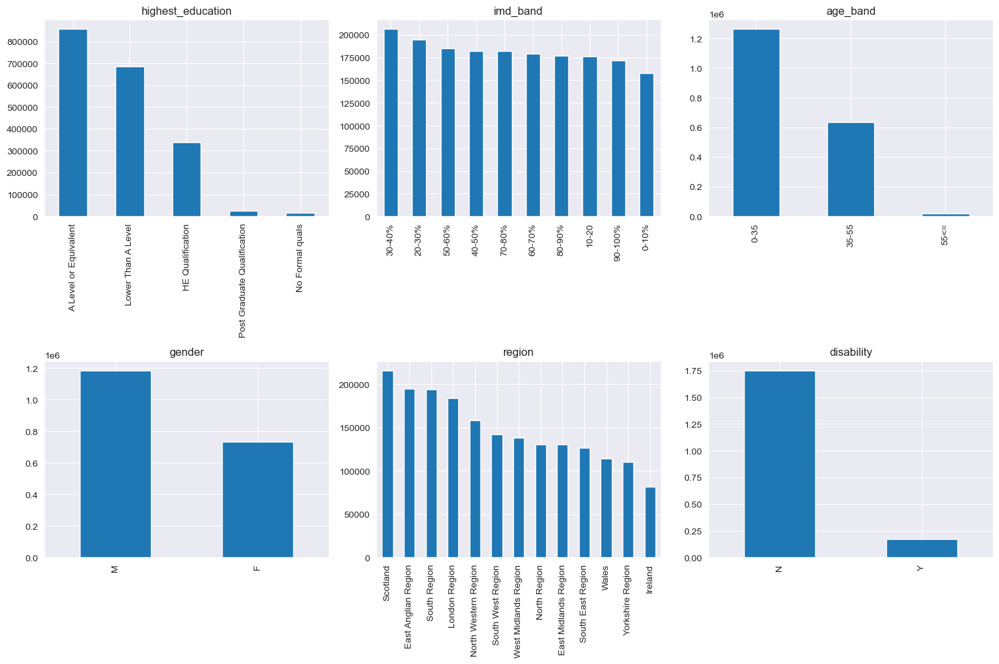

In [20]:
#checking the distribution of each categorical column using bar plots
categorical_vars = ['highest_education', 'imd_band', 'age_band', 'gender', 'region', 'disability']

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

for i, var in enumerate(categorical_vars):
    grouped_df[var].value_counts().plot(kind='bar', ax=axs[i])
    axs[i].set_title(var)
    axs[i].set_xlabel('')

plt.tight_layout()
plt.show()

study each histogram and each bar plot to see if some things are abnormal and need normalizations


In [21]:
#there are extreme values in date_submitted, -11 to 608 , we've set it to 0 & 365
df_cleaned = grouped_df[(grouped_df['date_submitted'] >= 0) & (grouped_df['date_submitted'] <= 365)]

#there is quite a lot of people with 0 score, that would mean that those are mostly not engaged, therefore they'd provide bias in our model so we'll exclude them
df_cleaned = df_cleaned[df_cleaned['score'] > 0]

#drop the observations with missing score values : 352 missing values
df_cleaned.dropna(subset=['score'], inplace=True)

print(df_cleaned.shape)
print(df_cleaned.isnull().sum())

(1905380, 16)
id_student                   0
code_module                  0
code_presentation            0
id_site                      0
gender                       0
region                       0
highest_education            0
imd_band                106611
age_band                     0
num_of_prev_attempts         0
disability                   0
id_assessment                0
date_submitted               0
is_banked                    0
score                        0
sum_click                    0
dtype: int64


Correlation Analysis

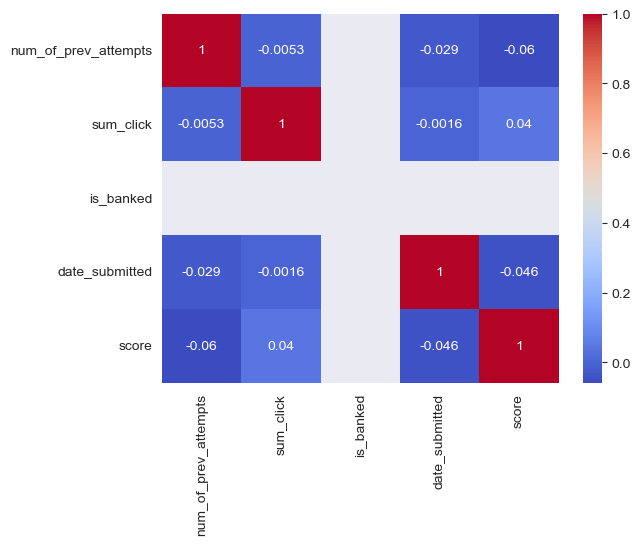

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



# Select the columns to include in the correlation analysis
cols = ['highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts',
        'sum_click', 'is_banked', 'date_submitted', 'gender', 'region',
        'disability','score']

# Compute the correlation matrix
corr = df_cleaned[cols].corr()

# Visualize the correlation matrix using a heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()


LET'S TREAT MISSING VALUES : imd_band 106611 missing values

WORKING ON THIS FOR NOW

(WORK ON THIS FOR NOW)

In [17]:

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from tqdm import tqdm

# Define functions for converting between imd_band and percentage
def convert_imd_band(imd_band):
    if imd_band == '0-10%':
        return 0
    elif imd_band == '10-20':
        return 1
    elif imd_band == '20-30%':
        return 2
    elif imd_band == '30-40%':
        return 3
    elif imd_band == '40-50%':
        return 4
    elif imd_band == '50-60%':
        return 5
    elif imd_band == '60-70%':
        return 6
    elif imd_band == '70-80%':
        return 7
    elif imd_band == '80-90%':
        return 8
    elif imd_band == '90-100%':
        return 9


# categorical columns in the data
cat_cols = ['code_module', 'code_presentation', 'gender', 'region', 'highest_education', 'age_band', 'disability']

# Split the data into two parts: one with missing values in imd_band, and another with no missing values
df_missing = df_cleaned[df_cleaned['imd_band'].isna()]
df_not_missing = df_cleaned[~df_cleaned['imd_band'].isna()]

# Split df_not_missing into train and test sets
X_train, X_test, y_train_cat, y_test_cat = train_test_split(df_not_missing.drop('imd_band', axis=1), df_not_missing['imd_band'], test_size=0.2, random_state=42)

# Convert categorical values to numerical values
y_train = y_train_cat.apply(convert_imd_band)
y_test = y_test_cat.apply(convert_imd_band)


In [18]:
df_missing.head(200)

,id_student,code_module,code_presentation,id_site,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,disability,id_assessment,date_submitted,is_banked,score,sum_click
3098,29639,CCC,2014J,909013,M,North Region,Lower Than A Level,None,0-35,0,N,24291,32,0,90.0,11674
3099,29639,CCC,2014J,909014,M,North Region,Lower Than A Level,None,0-35,0,N,24291,32,0,90.0,1469
3100,29639,CCC,2014J,909016,M,North Region,Lower Than A Level,None,0-35,0,N,24291,32,0,90.0,1924
3101,29639,CCC,2014J,909018,M,North Region,Lower Than A Level,None,0-35,0,N,24291,32,0,90.0,10439
3102,29639,CCC,2014J,909019,M,North Region,Lower Than A Level,None,0-35,0,N,24291,32,0,90.0,3562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7078,37298,FFF,2013B,526825,M,Ireland,HE Qualification,None,0-35,0,N,34860,19,0,92.0,33
7079,37298,FFF,2013B,526827,M,Ireland,HE Qualification,None,0-35,0,N,34860,19,0,92.0,473
7080,37298,FFF,2013B,526831,M,Ireland,HE Qualification,None,0-35,0,N,34860,19,0,92.0,308
7081,37298,FFF,2013B,526833,M,Ireland,HE Qualification,None,0-35,0,N,34860,19,0,92.0,297


In [40]:
from sklearn.preprocessing import OneHotEncoder
import numpy as np
# categorical columns in the data
cat_cols = ['code_module', 'code_presentation', 'gender', 'region', 'highest_education', 'age_band', 'disability']

# initialize the encoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

# fit the encoder on the categorical columns of the training data
encoder.fit(X_train[cat_cols])

# transform the categorical columns of the training and test data
X_train_encoded = encoder.transform(X_train[cat_cols])
X_test_encoded = encoder.transform(X_test[cat_cols])
df_missing_encoded = encoder.transform(df_missing[cat_cols])

# get the names of the encoded columns
cat_col_names = encoder.get_feature_names(cat_cols)

# concatenate the encoded columns with the non-categorical columns
X_train_processed = np.concatenate((X_train_encoded, X_train.drop(cat_cols, axis=1)), axis=1)
X_test_processed = np.concatenate((X_test_encoded, X_test.drop(cat_cols, axis=1)), axis=1)
df_missing_processed = np.concatenate((df_missing_encoded, df_missing.drop(cat_cols + ['imd_band'], axis=1)), axis=1)

# print the first five rows of the processed training data
print(X_train_processed[:5])
# print the column names of the processed training data
col_names = np.concatenate((cat_col_names, X_train.drop(cat_cols, axis=1).columns))
print(col_names)



df_missing_processed_df = pd.DataFrame(data=df_missing_processed, columns=col_names)
df_missing_processed_df.head(200)
#X_train_df = pd.DataFrame(X_train_processed, columns=col_names)
#X_train_df.head(200)

C:\Users\Abirr\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


[[0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00
  1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00
  5.89894e+05 7.29671e+05 0.00000e+00 2.42860e+04 2.00000e+01 0.00000e+00
  6.00000e+01 2.15000e+02]
 [0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00
  0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00
  0.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00
  5.98213e+

,code_module_AAA,code_module_BBB,code_module_CCC,code_module_DDD,code_module_EEE,code_module_FFF,code_module_GGG,code_presentation_2013B,code_presentation_2013J,code_presentation_2014B,...,disability_N,disability_Y,id_student,id_site,num_of_prev_attempts,id_assessment,date_submitted,is_banked,score,sum_click
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,29639.0,909013.0,0.0,24291.0,32.0,0.0,90.0,11674.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,29639.0,909014.0,0.0,24291.0,32.0,0.0,90.0,1469.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,29639.0,909016.0,0.0,24291.0,32.0,0.0,90.0,1924.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,29639.0,909018.0,0.0,24291.0,32.0,0.0,90.0,10439.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,29639.0,909019.0,0.0,24291.0,32.0,0.0,90.0,3562.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,37298.0,526825.0,0.0,34860.0,19.0,0.0,92.0,33.0
196,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,37298.0,526827.0,0.0,34860.0,19.0,0.0,92.0,473.0
197,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,37298.0,526831.0,0.0,34860.0,19.0,0.0,92.0,308.0
198,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,37298.0,526833.0,0.0,34860.0,19.0,0.0,92.0,297.0


In [23]:
n_samples, n_features = X_train_encoded.shape
n_samples, n_features_processed = X_train_processed.shape
print(f"Training set contains {n_samples} samples and {n_features} features.")

Training set contains 1439015 samples and 36 features.


In [21]:
# concatenate the processed training and test data
X_processed = np.concatenate((X_train_processed, X_test_processed), axis=0)
X_processed_df = pd.DataFrame(X_processed, columns=col_names)

y_processed = np.concatenate((y_train, y_test), axis=0)

# concatenate the original non-missing data and the processed missing data
df_not_missing_processed = pd.concat([X_processed_df, pd.DataFrame(data=y_processed, columns=['imd_band'])], axis=1)

In [33]:
print(X_train_processed.shape)

(1439015, 44)


THIS TRAINS THE MODEL AGAIN DON'T RUN IT

In [23]:

# Train an XGBoost model
xgb_model = XGBClassifier(n_estimators=100, max_depth=6, objective='multi:softmax', num_class=10, verbosity=1, tree_method='gpu_hist')

# Track progress
for i in tqdm(range(100)):
    xgb_model.fit(X_train_encoded, y_train)

100%|██████████| 100/100 [34:42<00:00, 20.83s/it]


HYPER PARAMETER TUNING USING Grid Search (ended up making results worse)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search over
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 150]
}

# Create an XGBClassifier
xgb_model = XGBClassifier(objective='multi:softmax', num_class=10, verbosity=1, tree_method='gpu_hist')

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(xgb_model, param_grid, cv=3)
grid_search.fit(X_train_encoded, y_train)

# Print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)

Result of the Grid Search : the Best(hypothetically) hyper parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150}






THIS IS TO SAVE THE TRAINED XGBoost MODEL


In [ ]:
import pickle

# Save the trained model
with open('xgb_model.pickle', 'wb') as f:
    pickle.dump(xgb_model, f)

THIS IS TO LOAD THE TRAINED XGBoost MODEL

In [ ]:
import pickle

# Load the saved model
with open('xgb_model.pickle', 'rb') as f:
    xgb_model = pickle.load(f)

V2

In [25]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

X_train_encoded_dense = X_train_encoded.toarray()
X_test_encoded_dense = X_test_encoded.toarray()

model = keras.Sequential([
    layers.Dense(128, activation='relu', input_shape=[n_features]),
    layers.Dense(64, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_encoded_dense, y_train, epochs=75, validation_data=(X_test_encoded_dense, y_test))
print(history.history['accuracy']) # training accuracy
print(history.history['val_accuracy']) # validation accuracy


# Evaluate model on test set
#test_loss, test_accuracy = model.evaluate(X_test_encoded, y_test)
#print('Test accuracy:', test_accuracy)

# Get predictions for training data
#train_preds = model.predict(X_train_encoded)

# Calculate training accuracy
#train_acc = accuracy_score(y_train, train_preds)
#print(f"Training accuracy: {train_acc}")



Epoch 1/75
44970/44970 [==============================] - 61s 1ms/step - loss: 1.9459 - accuracy: 0.2774 - val_loss: 1.8290 - val_accuracy: 0.3139
Epoch 2/75
44970/44970 [==============================] - 56s 1ms/step - loss: 1.7879 - accuracy: 0.3262 - val_loss: 1.7636 - val_accuracy: 0.3320
Epoch 3/75
44970/44970 [==============================] - 50s 1ms/step - loss: 1.7486 - accuracy: 0.3352 - val_loss: 1.7372 - val_accuracy: 0.3374
Epoch 4/75
44970/44970 [==============================] - 46s 1ms/step - loss: 1.7274 - accuracy: 0.3405 - val_loss: 1.7258 - val_accuracy: 0.3400
Epoch 5/75
44970/44970 [==============================] - 48s 1ms/step - loss: 1.7142 - accuracy: 0.3430 - val_loss: 1.7069 - val_accuracy: 0.3461
Epoch 6/75
44970/44970 [==============================] - 53s 1ms/step - loss: 1.7040 - accuracy: 0.3447 - val_loss: 1.7006 - val_accuracy: 0.3462
Epoch 7/75
44970/44970 [==============================] - 51s 1ms/step - loss: 1.6957 - accuracy: 0.3464 - val_loss: 1

LETS COMPARE THE RESULTS

In [28]:
# Generate predictions for the test set
y_pred = model.predict(X_test_encoded_dense)

# Convert predicted probabilities to class labels
y_pred_classes = np.argmax(y_pred, axis=1)

# Compare predicted vs actual values
for i in range(len(y_test)):
    print(f"Predicted: {y_pred_classes[i]} | Real: {y_test.iloc[i]}")

11243/11243 [==============================] - 8s 671us/step
Predicted: 6 | Real: 6
Predicted: 9 | Real: 9
Predicted: 9 | Real: 9
Predicted: 1 | Real: 7
Predicted: 0 | Real: 8
Predicted: 9 | Real: 9
Predicted: 1 | Real: 1
Predicted: 7 | Real: 7
Predicted: 8 | Real: 0
Predicted: 8 | Real: 8
Predicted: 4 | Real: 8
Predicted: 2 | Real: 0
Predicted: 4 | Real: 8
Predicted: 9 | Real: 6
Predicted: 6 | Real: 7
Predicted: 1 | Real: 0
Predicted: 6 | Real: 6
Predicted: 7 | Real: 7
Predicted: 4 | Real: 4
Predicted: 2 | Real: 8
Predicted: 0 | Real: 8
Predicted: 1 | Real: 8
Predicted: 8 | Real: 3
Predicted: 5 | Real: 9
Predicted: 0 | Real: 0
Predicted: 8 | Real: 2
Predicted: 1 | Real: 8
Predicted: 0 | Real: 5
Predicted: 3 | Real: 3
Predicted: 9 | Real: 8
Predicted: 3 | Real: 8
Predicted: 2 | Real: 2
Predicted: 1 | Real: 5
Predicted: 8 | Real: 8
Predicted: 9 | Real: 4
Predicted: 6 | Real: 9
Predicted: 9 | Real: 3
Predicted: 8 | Real: 8
Predicted: 3 | Real: 2
Predicted: 9 | Real: 1
Predicted: 0 | Real

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



11243/11243 [==============================] - 7s 651us/step
Predicted: 6 | Real: 6
Predicted: 9 | Real: 9
Predicted: 9 | Real: 9
Predicted: 1 | Real: 7
Predicted: 0 | Real: 8
Predicted: 9 | Real: 9
Predicted: 1 | Real: 1
Predicted: 7 | Real: 7
Predicted: 8 | Real: 0
Predicted: 8 | Real: 8
Predicted: 4 | Real: 8
Predicted: 2 | Real: 0
Predicted: 4 | Real: 8
Predicted: 9 | Real: 6
Predicted: 6 | Real: 7
Predicted: 1 | Real: 0
Predicted: 6 | Real: 6
Predicted: 7 | Real: 7
Predicted: 4 | Real: 4
Predicted: 2 | Real: 8
Predicted: 0 | Real: 8
Predicted: 1 | Real: 8
Predicted: 8 | Real: 3
Predicted: 5 | Real: 9
Predicted: 0 | Real: 0
Predicted: 8 | Real: 2
Predicted: 1 | Real: 8
Predicted: 0 | Real: 5
Predicted: 3 | Real: 3
Predicted: 9 | Real: 8
Predicted: 3 | Real: 8
Predicted: 2 | Real: 2
Predicted: 1 | Real: 5
Predicted: 8 | Real: 8
Predicted: 9 | Real: 4
Predicted: 6 | Real: 9
Predicted: 9 | Real: 3
Predicted: 8 | Real: 8
Predicted: 3 | Real: 2
Predicted: 9 | Real: 1
Predicted: 0 | Real

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SAVE THE MODEL

In [29]:
model.save('my_neural_network_model.h5')


LOAD THE MODEL

In [ ]:
from tensorflow.keras.models import load_model

model = load_model('my_neural_network_model.h5')


LETS TRY ANOTHER NEURAL NETWORK, V3

In [44]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers, regularizers

X_train_encoded_dense = X_train_encoded.toarray()
X_test_encoded_dense = X_test_encoded.toarray()

model2 = keras.Sequential([
    layers.Dense(256, activation='relu', input_shape=[n_features]),
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

model2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

history2 = model2.fit(X_train_encoded_dense, y_train, epochs=17, validation_data=(X_test_encoded_dense, y_test), workers=14)
print(history2.history['accuracy']) # training accuracy
print(history2.history['val_accuracy']) # validation accuracy

Epoch 1/17
70000/70000 [==============================] - 76s 1ms/step - loss: 1.8237 - accuracy: 0.3121 - val_loss: 1.7023 - val_accuracy: 0.3433
Epoch 2/17
70000/70000 [==============================] - 75s 1ms/step - loss: 1.6696 - accuracy: 0.3499 - val_loss: 1.6507 - val_accuracy: 0.3499
Epoch 3/17
70000/70000 [==============================] - 76s 1ms/step - loss: 1.6371 - accuracy: 0.3542 - val_loss: 1.6267 - val_accuracy: 0.3545
Epoch 4/17
70000/70000 [==============================] - 82s 1ms/step - loss: 1.6208 - accuracy: 0.3563 - val_loss: 1.6139 - val_accuracy: 0.3563
Epoch 5/17
70000/70000 [==============================] - 85s 1ms/step - loss: 1.6106 - accuracy: 0.3570 - val_loss: 1.6025 - val_accuracy: 0.3604
Epoch 6/17
70000/70000 [==============================] - 79s 1ms/step - loss: 1.6031 - accuracy: 0.3581 - val_loss: 1.6040 - val_accuracy: 0.3576
Epoch 7/17
70000/70000 [==============================] - 76s 1ms/step - loss: 1.5980 - accuracy: 0.3586 - val_loss: 1

COMPARE THE RESULTS OF THE SECOND NN (36% Accuracy, better)

In [40]:
# Generate predictions for the test set
y_pred = model2.predict(X_test_encoded_dense)

# Convert predicted probabilities to class labels
y_pred_classes = np.argmax(y_pred, axis=1)

# Compare predicted vs actual values
for i in range(len(y_test)):
    print(f"Predicted: {y_pred_classes[i]} | Real: {y_test.iloc[i]}")

11243/11243 [==============================] - 12s 1ms/step
Predicted: 3 | Real: 6
Predicted: 9 | Real: 9
Predicted: 0 | Real: 9
Predicted: 1 | Real: 7
Predicted: 0 | Real: 8
Predicted: 2 | Real: 9
Predicted: 1 | Real: 1
Predicted: 7 | Real: 7
Predicted: 8 | Real: 0
Predicted: 8 | Real: 8
Predicted: 8 | Real: 8
Predicted: 2 | Real: 0
Predicted: 0 | Real: 8
Predicted: 6 | Real: 6
Predicted: 6 | Real: 7
Predicted: 3 | Real: 0
Predicted: 5 | Real: 6
Predicted: 7 | Real: 7
Predicted: 4 | Real: 4
Predicted: 2 | Real: 8
Predicted: 0 | Real: 8
Predicted: 1 | Real: 8
Predicted: 8 | Real: 3
Predicted: 3 | Real: 9
Predicted: 0 | Real: 0
Predicted: 2 | Real: 2
Predicted: 1 | Real: 8
Predicted: 0 | Real: 5
Predicted: 7 | Real: 3
Predicted: 9 | Real: 8
Predicted: 3 | Real: 8
Predicted: 8 | Real: 2
Predicted: 5 | Real: 5
Predicted: 8 | Real: 8
Predicted: 0 | Real: 4
Predicted: 4 | Real: 9
Predicted: 9 | Real: 3
Predicted: 8 | Real: 8
Predicted: 3 | Real: 2
Predicted: 0 | Real: 1
Predicted: 3 | Real:

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



SAVE THE SECOND NN MODEL

In [41]:
model2.save('my_2ND_neural_network_model.h5')

LOAD THE SECOND NN MODEL

In [28]:
from tensorflow.keras.models import load_model

model2 = load_model('my_2ND_neural_network_model.h5')

Predict on the data with missing imd_band values and insert the data there

In [29]:
import pandas as pd
import numpy as np
from tensorflow import keras

# Predict the imd_band for the missing rows
predicted_imd_band = model2.predict(df_missing_encoded)

# Convert the predicted probabilities to the predicted class labels
predicted_imd_band = np.argmax(predicted_imd_band, axis=1)

# Fill in the predicted imd_band values for the missing rows
df_missing_processed_df['imd_band'] = predicted_imd_band
#df_missing_processed_df.loc[df_missing_processed_df['imd_band'].isnull(), 'imd_band'] = predicted_imd_band

# Save the updated test dataset
df_missing_processed_df.to_csv('df_cleaned_imputed.csv', index=False)


3332/3332 [==============================] - 3s 743us/step


In [58]:
df_missing_processed_df.head(200)

,code_module_AAA,code_module_BBB,code_module_CCC,code_module_DDD,code_module_EEE,code_module_FFF,code_module_GGG,code_presentation_2013B,code_presentation_2013J,code_presentation_2014B,...,disability_Y,id_student,id_site,num_of_prev_attempts,id_assessment,date_submitted,is_banked,score,sum_click,imd_band
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,29639.0,909013.0,0.0,24291.0,32.0,0.0,90.0,11674.0,3
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,29639.0,909014.0,0.0,24291.0,32.0,0.0,90.0,1469.0,3
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,29639.0,909016.0,0.0,24291.0,32.0,0.0,90.0,1924.0,3
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,29639.0,909018.0,0.0,24291.0,32.0,0.0,90.0,10439.0,3
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,29639.0,909019.0,0.0,24291.0,32.0,0.0,90.0,3562.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,37298.0,526825.0,0.0,34860.0,19.0,0.0,92.0,33.0,9
196,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,37298.0,526827.0,0.0,34860.0,19.0,0.0,92.0,473.0,9
197,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,37298.0,526831.0,0.0,34860.0,19.0,0.0,92.0,308.0,9
198,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,37298.0,526833.0,0.0,34860.0,19.0,0.0,92.0,297.0,9


RE-MERGE THE SUB DATASETS TOGETHER

In [30]:

df_full = pd.concat([df_not_missing_processed, df_missing_processed_df], axis=0)

# reset the index of the combined dataset
df_full.reset_index(drop=True, inplace=True)

# print the first five rows of the combined dataset
print(df_full.shape)
print(df_full.head())


(1905380, 45)
   code_module_AAA  code_module_BBB  code_module_CCC  code_module_DDD  \
0              0.0              0.0              1.0              0.0   
1              0.0              0.0              0.0              0.0   
2              0.0              0.0              0.0              0.0   
3              0.0              0.0              0.0              0.0   
4              0.0              0.0              0.0              1.0   

   code_module_EEE  code_module_FFF  code_module_GGG  code_presentation_2013B  \
0              0.0              0.0              0.0                      0.0   
1              0.0              1.0              0.0                      0.0   
2              0.0              1.0              0.0                      0.0   
3              0.0              1.0              0.0                      0.0   
4              0.0              0.0              0.0                      0.0   

   code_presentation_2013J  code_presentation_2014B  ...  di

In [ ]:

df_full.to_csv('df_full_cleaned_jawhabehy_readyleljaww', index=False)

In [31]:
print(df_full.shape)
print(df_full.isnull().sum())

(1905380, 45)
code_module_AAA                                  0
code_module_BBB                                  0
code_module_CCC                                  0
code_module_DDD                                  0
code_module_EEE                                  0
code_module_FFF                                  0
code_module_GGG                                  0
code_presentation_2013B                          0
code_presentation_2013J                          0
code_presentation_2014B                          0
code_presentation_2014J                          0
gender_F                                         0
gender_M                                         0
region_East Anglian Region                       0
region_East Midlands Region                      0
region_Ireland                                   0
region_London Region                             0
region_North Region                              0
region_North Western Region                      0
region_Scotland  

In [32]:
df_full.head(2000)

,code_module_AAA,code_module_BBB,code_module_CCC,code_module_DDD,code_module_EEE,code_module_FFF,code_module_GGG,code_presentation_2013B,code_presentation_2013J,code_presentation_2014B,...,disability_Y,id_student,id_site,num_of_prev_attempts,id_assessment,date_submitted,is_banked,score,sum_click,imd_band
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,589894.0,729671.0,0.0,24286.0,20.0,0.0,60.0,215.0,8
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,598213.0,716657.0,0.0,34873.0,17.0,0.0,74.0,60.0,0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,648114.0,883084.0,0.0,34899.0,21.0,0.0,76.0,264.0,8
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,602516.0,716310.0,0.0,34873.0,17.0,0.0,84.0,60.0,5
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,432642.0,924980.0,0.0,25362.0,19.0,0.0,85.0,7.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,537622.0,547932.0,0.0,24286.0,20.0,0.0,70.0,135.0,0
1996,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,571190.0,779619.0,0.0,34886.0,20.0,0.0,78.0,24.0,5
1997,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,2553363.0,527431.0,0.0,34860.0,18.0,0.0,84.0,24.0,5
1998,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,154011.0,703940.0,0.0,14996.0,12.0,0.0,76.0,11.0,3


USER-ITEM MATRIX : Relevant Features : code_module,code_presentation,id_student,id_site,activity_type,date,sum_click

In [22]:
import pandas as pd
student_info = pd.read_csv('studentInfo.csv')
student_vle = pd.read_csv('studentVle.csv')
vle = pd.read_csv('vle.csv')


U_I_student_info = student_info[['code_module', 'code_presentation', 'id_student']]
U_I_student_vle = student_vle[['code_module', 'code_presentation', 'id_student', 'id_site', 'date', 'sum_click']]
U_I_vle = vle[['id_site','activity_type']]

In [23]:
U_I_merged_df = pd.merge(U_I_student_info, U_I_student_vle, on=['code_module', 'code_presentation', 'id_student'], how='inner')
U_I_merged_df = pd.merge(U_I_merged_df, U_I_vle, on=['id_site'], how='inner')

In [24]:
U_I_merged_df.head(200)

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type
0,AAA,2013J,11391,546669,-5,16,oucontent
1,AAA,2013J,11391,546669,17,15,oucontent
2,AAA,2013J,28400,546669,6,4,oucontent
3,AAA,2013J,28400,546669,7,1,oucontent
4,AAA,2013J,32885,546669,13,3,oucontent
...,...,...,...,...,...,...,...
195,AAA,2013J,202635,546669,23,34,oucontent
196,AAA,2013J,205350,546669,5,12,oucontent
197,AAA,2013J,205350,546669,13,3,oucontent
198,AAA,2013J,205350,546669,17,6,oucontent


User-item matrix : sum_click || we're also using aggfunc='sum' to group by basically

In [25]:
user_item_matrix = pd.pivot_table(U_I_merged_df, values='sum_click', index='id_student', columns='id_site', aggfunc='sum')

DEMOGRAPHICS + PERFORMANCE Based Classification

Correlation analysis

Feature selection

Time series analysis // order by date


Cluster analysis